# Clustering Full

Goal - Cluster the users based on the count of symptoms they have had.

User selection criteria - None, everyone is considered in this one.

In [5]:
import pandas as pd
import numpy as np
from pyathena import connect
from pyathena.pandas.cursor import PandasCursor
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [6]:
from sensorfabric.athena import athena

In [7]:
# Establish connection with the database using PyAthena.
cursor = connect(s3_staging_dir='s3://menolife-opensci/athena/',
                  schema_name='menolife',
                  cursor_class=PandasCursor,
                  work_group='amyris',
                  region_name='us-east-1'
                ).cursor()

In [9]:
%set_env AWS_PROFILE=opensci
db = athena(database='menolife', workgroup='amyris', offlineCache=True)

env: AWS_PROFILE=opensci


## Dataset creation

In [ ]:
# Get all the symptoms.
symptoms = db.execQuery('select distinct(name) name from symptoms order by name asc', cached=True)
print(symptoms.shape)

In [ ]:
# Create an empty list for all the columns which are going to be the individual symptoms.
symptoms = symptoms['name'].values

In [ ]:
# Run the query to get the symptom count for all the users who have recorded at least 30 days of symptom data in total.
users = db.execQuery("""
                    select uid, name, count(name) count from symptoms s 
                    group by uid, name
                    order by uid
                    """, cached=True)
print(users.shape)

(186467, 3)


In [ ]:
frame = pd.DataFrame()  # Empty dataframe that will contain all the dataset.
uidmap = {}
# Start breaking the users frame and extract data from it to add to the data matrix.
temp = None  # Temp dictionary that holds the symptom counts for each user.
for uid, sname, scount in zip(users['uid'].values, users['name'].values, users['count'].values):
    if not (uid in uidmap):
        # If temp is not None (everything except for the first uid then we will concat the last uid to the frame.
        if not (temp is None):
            temp = pd.Series(temp)
            temp = temp.to_frame().T
            frame = pd.concat([frame, temp], ignore_index=True)
        temp = {}  # Start fresh again.
        temp['uid'] = uid
        uidmap[uid] = 1
    temp[sname] = scount
frame = frame.set_index(['uid']) # Set the 'uid' as the index, so it becomes easier to query.
frame = frame.fillna(0)

In [ ]:
frame.head()

,anxiety,nausea,ovulation,breast_swelling,constipation,bloating,dry_skin,headaches,vomiting,hot_flashes,...,uti,fatigue,spotting,ringing_ears,painful_intercourse,vaginal_dryness,yeast_infection,ovulation_pain,diarrhea,vertigo
uid,,,,,,,,,,,,,,,,,,,,,
5f8e89640054a6c5fab1544d,1,2,1,3,1,1,7,6,1,0,...,0,0,0,0,0,0,0,0,0,0
5f8e90320054a6c5fab1544e,17,0,2,11,0,19,10,3,0,26,...,0,0,0,0,0,0,0,0,0,0
5f8f175466dae0d0328adb76,2,0,0,6,0,4,1,0,0,6,...,1,0,0,0,0,0,0,0,0,0
5f8f260566dae0d0328adb7e,3,0,0,3,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
5f8f274466dae0d0328adb80,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
frame.shape

(25377, 45)

## Covariance matrix of the features

Standardize the features first.

In [ ]:
sframe = frame[symptoms]
sframe = (sframe - sframe.mean()) / sframe.std()

## Visualizing the distribution of some of the syptoms

Hotflashes

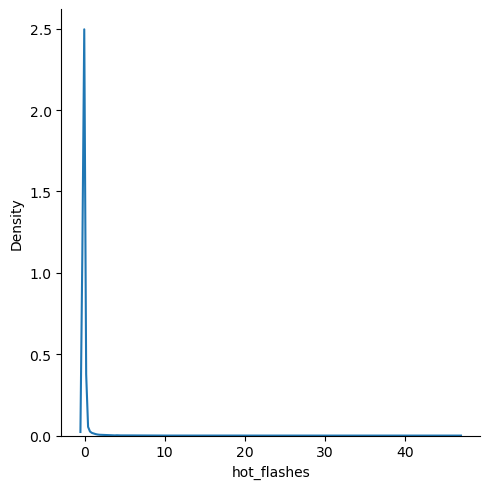

In [ ]:
sns.displot(sframe, x='hot_flashes', kind='kde')

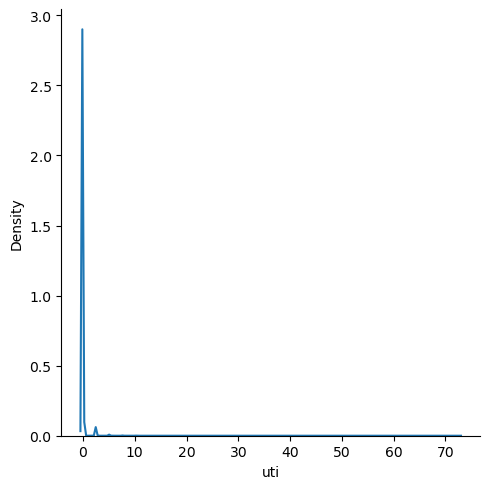

In [ ]:
sns.displot(sframe, x='uti', kind='kde')

In [ ]:
cmatrix = sframe.cov()

In [ ]:
cmatrix.to_csv('csv/symptom_covariance_full.csv', index=True)

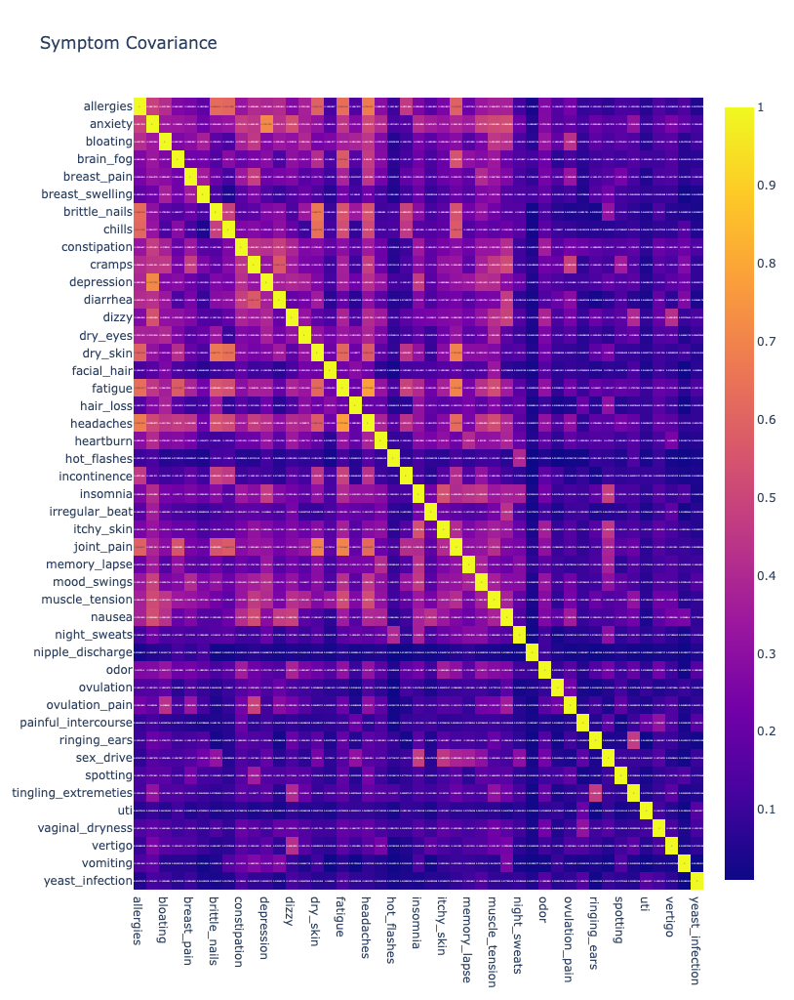

In [ ]:
fig = px.imshow(cmatrix, 
                width=2000, 
                height=1024, 
                text_auto=True, 
                aspect='auto',
                title='Symptom Covariance')
fig.show()
# Also go ahead and save this figure.
fig.write_image('figures/symptom_covariance_full.png')

### Notes

1. I find it interesting that covariance of all other features with Hotflahses is extremely low, except for Nightsweats. Could this mean that an increasing number of hotflash reporting is associated with an increasein the number of nightsweats reporting.

## Find pairs of symptoms with more than 60% corelation.

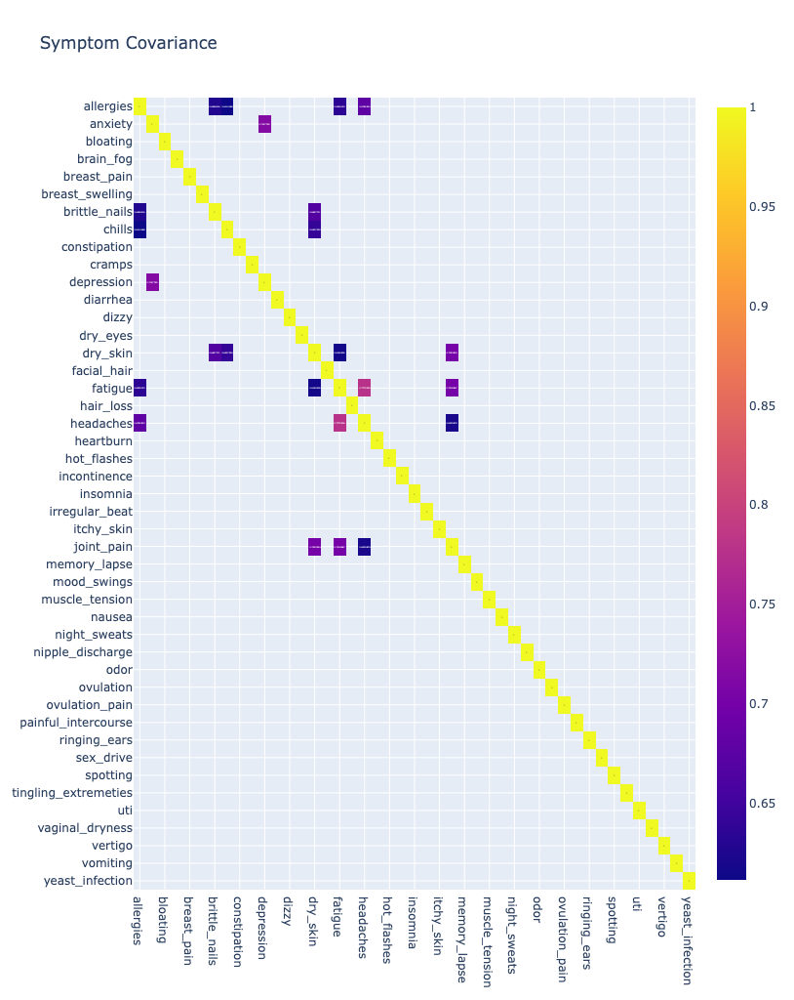

allergies - brittle_nails - 0.6268016457922795
allergies - chills - 0.6114188457948803
allergies - fatigue - 0.635913307496755
allergies - headaches - 0.6782902855581308
anxiety - depression - 0.7157794750141969
brittle_nails - allergies - 0.6268016457922795
brittle_nails - dry_skin - 0.6657711120432134
chills - allergies - 0.6114188457948803
chills - dry_skin - 0.6407325346237738
depression - anxiety - 0.7157794750141969
dry_skin - brittle_nails - 0.6657711120432134
dry_skin - chills - 0.6407325346237738
dry_skin - fatigue - 0.6149235941698682
dry_skin - joint_pain - 0.7023934444759912
fatigue - allergies - 0.635913307496755
fatigue - dry_skin - 0.6149235941698682
fatigue - headaches - 0.7775335617970226
fatigue - joint_pain - 0.7018866927366998
headaches - allergies - 0.6782902855581308
headaches - fatigue - 0.7775335617970226
headaches - joint_pain - 0.6205879202582179
joint_pain - dry_skin - 0.7023934444759912
joint_pain - fatigue - 0.7018866927366998
joint_pain - headaches - 0.620

In [ ]:
th = 0.6
fmatrix = cmatrix[cmatrix >= th]
fig = px.imshow(fmatrix, 
                width=1024, 
                height=1024, 
                text_auto=True, 
                aspect='auto',
                title='Symptom Covariance')
fig.show()
indexes = fmatrix.index.values
for s in symptoms:
    paired = fmatrix[s].dropna().index.values
    # We can go ahead print it out. 
    for p in paired:
        if not (s == p):
            print('{} - {} - {}'.format(s, p, fmatrix.loc[s][p]))

## Cluster Map

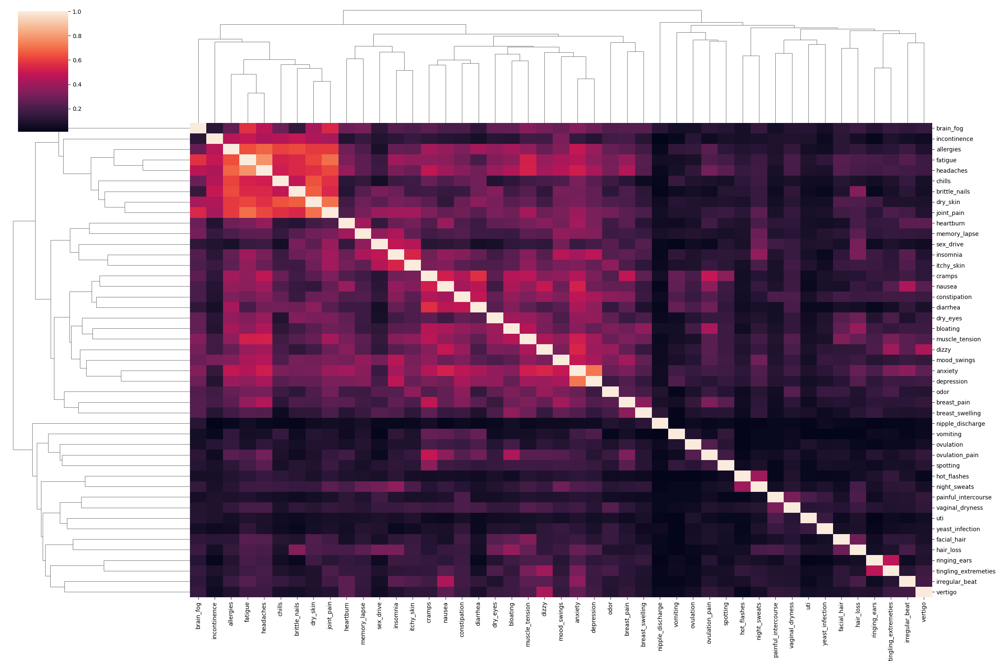

In [ ]:
hcluster = sns.clustermap(cmatrix, figsize=(24, 16))

In [ ]:
hcluster.savefig('figures/symptom_co_hirach_full.png')

## Perform PCA analysis on the data.

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=15, svd_solver='full')
X = frame[symptoms]

In [ ]:
pca.fit(X)

PCA(n_components=15, svd_solver='full')

In [ ]:
evariance = pca.explained_variance_ratio_
cvariance = np.cumsum(evariance)

The variance from the various features is -

In [ ]:
for i,v,c in zip(range(1, evariance.size+1), evariance, cvariance):
    print('PCA{} - {:.2f}, {:.2f}'.format(i, v, c))

PCA1 - 0.45, 0.45
PCA2 - 0.23, 0.68
PCA3 - 0.05, 0.72
PCA4 - 0.03, 0.76
PCA5 - 0.03, 0.78
PCA6 - 0.02, 0.81
PCA7 - 0.02, 0.83
PCA8 - 0.02, 0.84
PCA9 - 0.02, 0.86
PCA10 - 0.02, 0.88
PCA11 - 0.01, 0.89
PCA12 - 0.01, 0.90
PCA13 - 0.01, 0.91
PCA14 - 0.01, 0.92
PCA15 - 0.01, 0.93


Looks like we would need 12 principal components if we wanted to keep 90% of the variance. \
However the 2 components account for the majority of variance (64%), while an 80% variance is represented by 7 components.

In [ ]:
pcacomponents = pca.fit_transform(X)

In [ ]:
pcacomponents.shape

(25377, 15)

In [ ]:
# Get the impact of each feature on principal component.
impact = pca.components_.T
impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

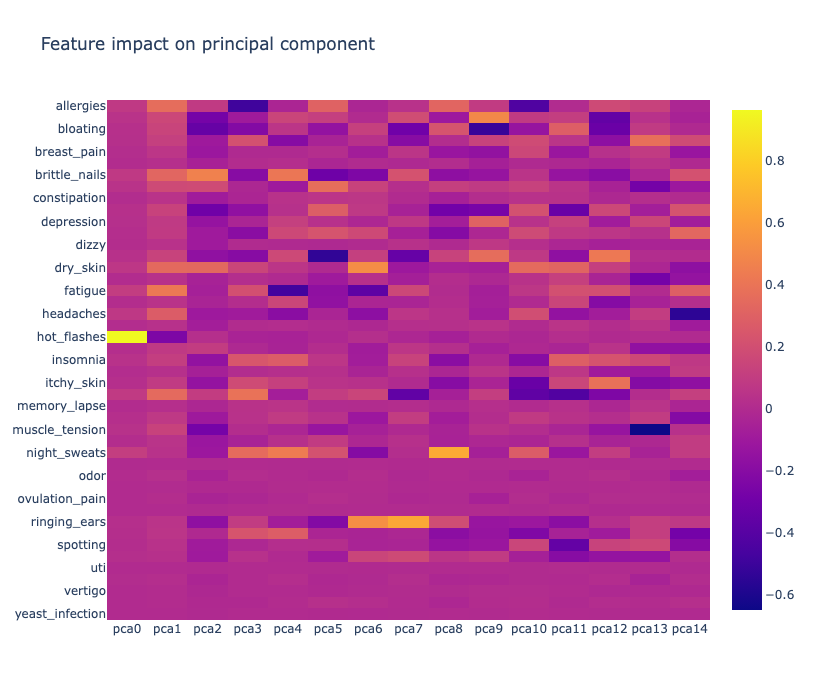

In [ ]:
px.imshow(impact, 
          width=512,
          height=700,
          aspect='auto',
          title='Feature impact on principal component')

For the clustering we just pick the components that give 80% variance

In [ ]:
pca = PCA(n_components=7, svd_solver='full')
pcacomponents = pca.fit_transform(X)
pcacomponents.shape

(25377, 7)

In [ ]:
from sklearn.cluster import KMeans

## Determining the optimal cluster size.

### Elbow Method

In [ ]:
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    sse.append(kmeans.inertia_)

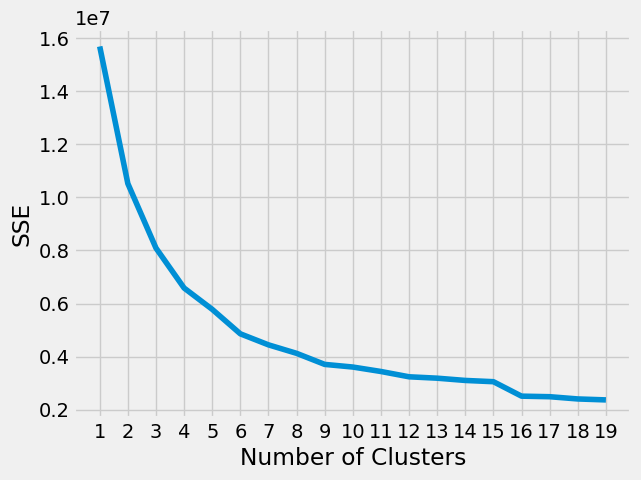

In [ ]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 20), sse)
plt.xticks(range(1, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [ ]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

6

Conclusion - Based on the elbow method, it looks like the optimal number of clusters would be **6**

### Silhouette Coefficient

Is a measure of cluster cohesion and separation. It quantifies how well a data point fits into its assigned cluster based on two factors:
* How close the data point is to other points in the cluster
* How far away the data point is from points in other clusters

Silhouette coefficient values range between -1 and 1. Larger numbers indicate that samples are closer to their clusters than they are to other clusters.

In [ ]:
from sklearn.metrics import silhouette_score

# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    score = silhouette_score(pcacomponents, kmeans.labels_)
    silhouette_coefficients.append(score)

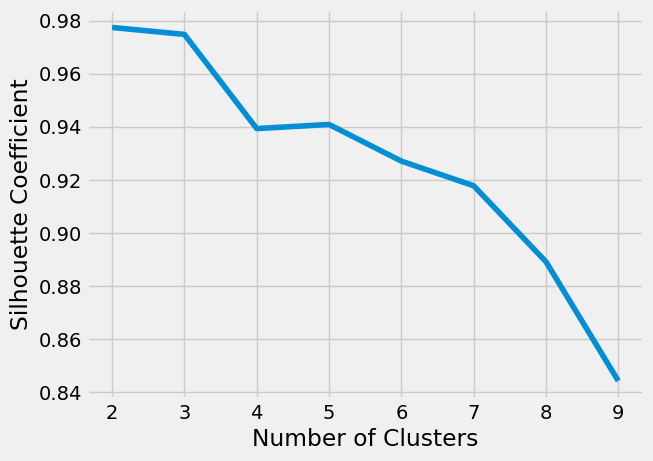

In [ ]:
plt.plot(range(2, 10), silhouette_coefficients)
plt.xticks(range(2, 10))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

Conclusion - From silhouette coeff it looks like the score is maximized for n=3 and then for n=6.
n=3 might be too small of a number of clusters. We will pick n=6 based on the elbow method + S method.

## Cluster them using k-means clustering

In [ ]:
kmeans = KMeans(n_clusters=6, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))

0 - 221
1 - 25037
2 - 41
3 - 64
4 - 9
5 - 5


## Get the users which belong to each of these clusters

In [ ]:
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]

## Find the top 5 symptoms reported by frequency for each of these segments.

In [ ]:
def getTopSymptoms(users, top=5):
    # Create the where statement that will be used to filter by these users.
    where_query = "uid = '{}'".format(users[0])
    for i in range(1, len(users)):
        where_query += " or uid = '{}'".format(users[i])
        
    query = """
        select name, count(name) occ from symptoms 
            where {where} 
            group by name
            order by occ desc
            limit {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    
    return results

In [ ]:
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

Summary of cohort symptoms -

PCA + Clustering was able to isolate the users into 4 clusters based on the occurance of their symptom reporting.a

## Alternatively if we use n=3 for segmentation

In [ ]:
kmeans = KMeans(n_clusters=3, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))
    
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]
    
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values
    
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

# Clustering Full

Goal - Cluster the users based on the count of symptoms they have had.

User selection criteria - None, everyone is considered in this one.

In [ ]:
import pandas as pd
import numpy as np
from pyathena import connect
from pyathena.pandas.cursor import PandasCursor
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [ ]:
from sensorfabric.athena import athena

In [ ]:
# Establish connection with the database using PyAthena.
cursor = connect(s3_staging_dir='s3://menolife-opensci/athena/',
                  schema_name='menolife',
                  cursor_class=PandasCursor,
                  work_group='amyris',
                  region_name='us-east-1'
                ).cursor()

In [ ]:
db = athena(database='menolife', workgroup='amyris', offlineCache=True)

## Dataset creation

In [ ]:
# Get all the symptoms.
symptoms = db.execQuery('select distinct(name) name from symptoms order by name asc', cached=True)
print(symptoms.shape)

(45, 1)


In [ ]:
# Create an empty list for all the columns which are going to be the individual symptoms.
symptoms = symptoms['name'].values

In [ ]:
# Run the query to get the symptom count for all the users who have recorded at least 30 days of symptom data in total.
users = db.execQuery("""
                    select uid, name, count(name) count from symptoms s 
                    group by uid, name
                    order by uid
                    """, cached=True)
print(users.shape)

(186467, 3)


In [ ]:
frame = pd.DataFrame()  # Empty dataframe that will contain all the dataset.
uidmap = {}
# Start breaking the users frame and extract data from it to add to the data matrix.
temp = None  # Temp dictionary that holds the symptom counts for each user.
for uid, sname, scount in zip(users['uid'].values, users['name'].values, users['count'].values):
    if not (uid in uidmap):
        # If temp is not None (everything except for the first uid then we will concat the last uid to the frame.
        if not (temp is None):
            temp = pd.Series(temp)
            temp = temp.to_frame().T
            frame = pd.concat([frame, temp], ignore_index=True)
        temp = {}  # Start fresh again.
        temp['uid'] = uid
        uidmap[uid] = 1
    temp[sname] = scount
frame = frame.set_index(['uid']) # Set the 'uid' as the index, so it becomes easier to query.
frame = frame.fillna(0)

In [ ]:
frame.head()

,anxiety,nausea,ovulation,breast_swelling,constipation,bloating,dry_skin,headaches,vomiting,hot_flashes,...,uti,fatigue,spotting,ringing_ears,painful_intercourse,vaginal_dryness,yeast_infection,ovulation_pain,diarrhea,vertigo
uid,,,,,,,,,,,,,,,,,,,,,
5f8e89640054a6c5fab1544d,1,2,1,3,1,1,7,6,1,0,...,0,0,0,0,0,0,0,0,0,0
5f8e90320054a6c5fab1544e,17,0,2,11,0,19,10,3,0,26,...,0,0,0,0,0,0,0,0,0,0
5f8f175466dae0d0328adb76,2,0,0,6,0,4,1,0,0,6,...,1,0,0,0,0,0,0,0,0,0
5f8f260566dae0d0328adb7e,3,0,0,3,0,0,1,0,1,1,...,0,0,0,0,0,0,0,0,0,0
5f8f274466dae0d0328adb80,0,0,0,0,0,1,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
frame.shape

(25377, 45)

## Covariance matrix of the features

Standardize the features first.

In [ ]:
sframe = frame[symptoms]
sframe = (sframe - sframe.mean()) / sframe.std()

## Visualizing the distribution of some of the syptoms

Hotflashes

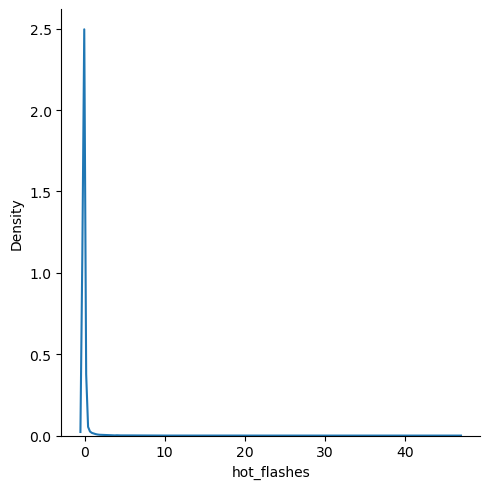

In [ ]:
sns.displot(sframe, x='hot_flashes', kind='kde')

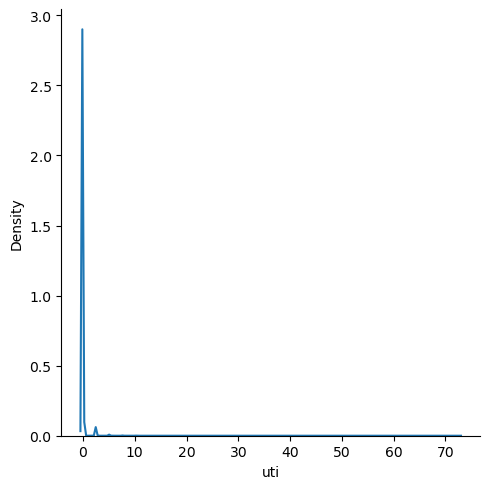

In [ ]:
sns.displot(sframe, x='uti', kind='kde')

In [ ]:
cmatrix = sframe.cov()

In [ ]:
cmatrix.to_csv('csv/symptom_covariance_full.csv', index=True)

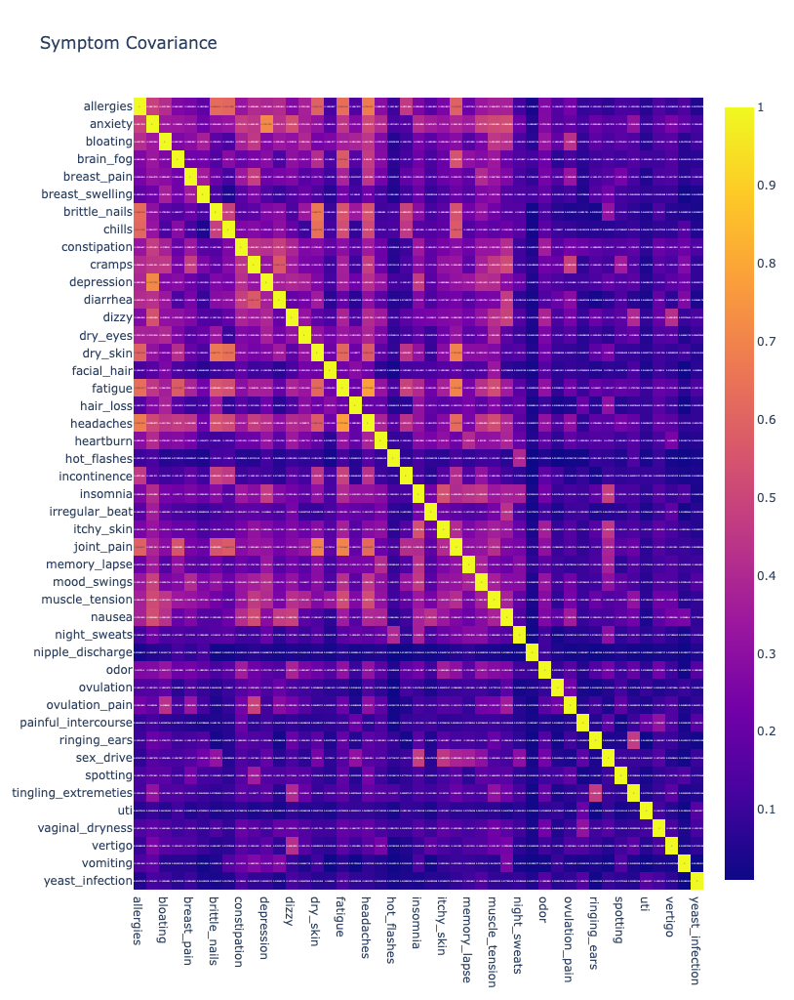

In [ ]:
fig = px.imshow(cmatrix, 
                width=2000, 
                height=1024, 
                text_auto=True, 
                aspect='auto',
                title='Symptom Covariance')
fig.show()
# Also go ahead and save this figure.
fig.write_image('figures/symptom_covariance_full.png')

### Notes

1. I find it interesting that covariance of all other features with Hotflahses is extremely low, except for Nightsweats. Could this mean that an increasing number of hotflash reporting is associated with an increasein the number of nightsweats reporting.

## Find pairs of symptoms with more than 60% corelation.

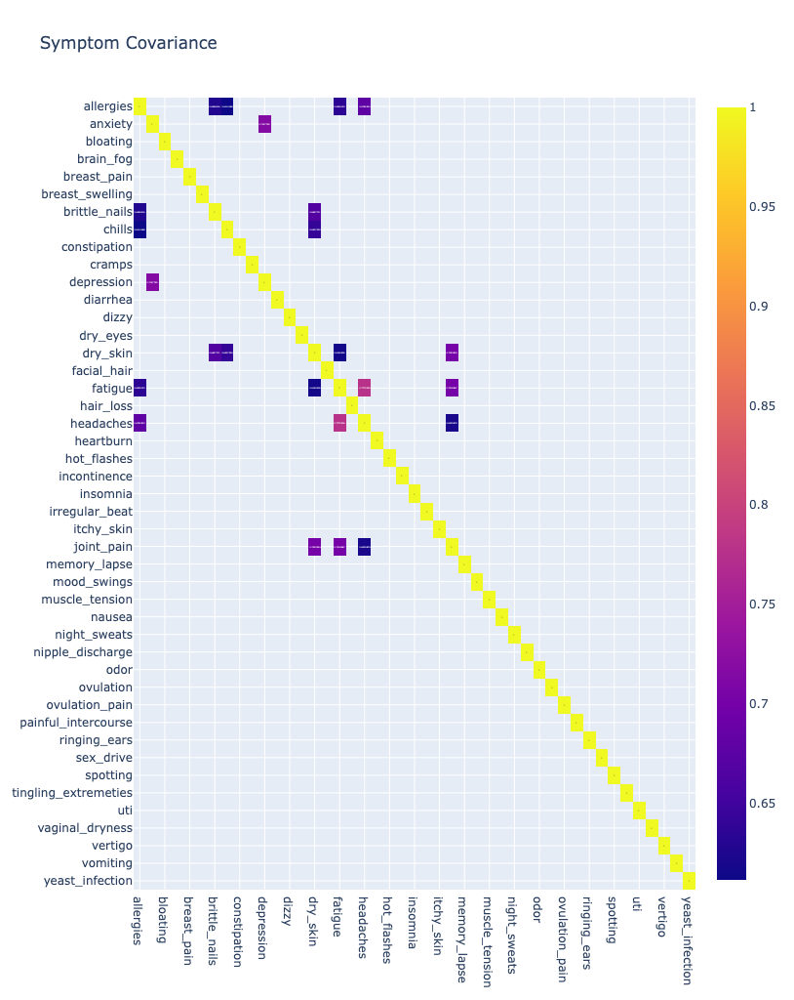

allergies - brittle_nails - 0.6268016457922795
allergies - chills - 0.6114188457948803
allergies - fatigue - 0.635913307496755
allergies - headaches - 0.6782902855581308
anxiety - depression - 0.7157794750141969
brittle_nails - allergies - 0.6268016457922795
brittle_nails - dry_skin - 0.6657711120432134
chills - allergies - 0.6114188457948803
chills - dry_skin - 0.6407325346237738
depression - anxiety - 0.7157794750141969
dry_skin - brittle_nails - 0.6657711120432134
dry_skin - chills - 0.6407325346237738
dry_skin - fatigue - 0.6149235941698682
dry_skin - joint_pain - 0.7023934444759912
fatigue - allergies - 0.635913307496755
fatigue - dry_skin - 0.6149235941698682
fatigue - headaches - 0.7775335617970226
fatigue - joint_pain - 0.7018866927366998
headaches - allergies - 0.6782902855581308
headaches - fatigue - 0.7775335617970226
headaches - joint_pain - 0.6205879202582179
joint_pain - dry_skin - 0.7023934444759912
joint_pain - fatigue - 0.7018866927366998
joint_pain - headaches - 0.620

In [ ]:
th = 0.6
fmatrix = cmatrix[cmatrix >= th]
fig = px.imshow(fmatrix, 
                width=1024, 
                height=1024, 
                text_auto=True, 
                aspect='auto',
                title='Symptom Covariance')
fig.show()
indexes = fmatrix.index.values
for s in symptoms:
    paired = fmatrix[s].dropna().index.values
    # We can go ahead print it out. 
    for p in paired:
        if not (s == p):
            print('{} - {} - {}'.format(s, p, fmatrix.loc[s][p]))

## Cluster Map

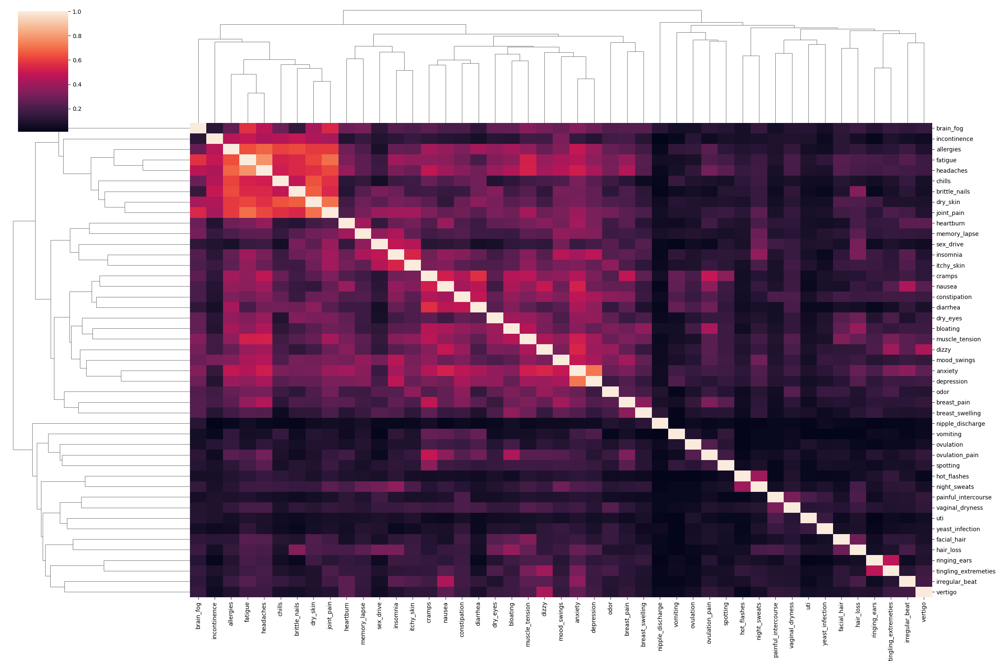

In [ ]:
hcluster = sns.clustermap(cmatrix, figsize=(24, 16))

In [ ]:
hcluster.savefig('figures/symptom_co_hirach_full.png')

## Perform PCA analysis on the data.

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components=15, svd_solver='full')
X = frame[symptoms]

In [ ]:
pca.fit(X)

PCA(n_components=15, svd_solver='full')

In [ ]:
evariance = pca.explained_variance_ratio_
cvariance = np.cumsum(evariance)

The variance from the various features is -

In [ ]:
for i,v,c in zip(range(1, evariance.size+1), evariance, cvariance):
    print('PCA{} - {:.2f}, {:.2f}'.format(i, v, c))

PCA1 - 0.45, 0.45
PCA2 - 0.23, 0.68
PCA3 - 0.05, 0.72
PCA4 - 0.03, 0.76
PCA5 - 0.03, 0.78
PCA6 - 0.02, 0.81
PCA7 - 0.02, 0.83
PCA8 - 0.02, 0.84
PCA9 - 0.02, 0.86
PCA10 - 0.02, 0.88
PCA11 - 0.01, 0.89
PCA12 - 0.01, 0.90
PCA13 - 0.01, 0.91
PCA14 - 0.01, 0.92
PCA15 - 0.01, 0.93


Looks like we would need 12 principal components if we wanted to keep 90% of the variance. \
However the 2 components account for the majority of variance (64%), while an 80% variance is represented by 7 components.

In [ ]:
pcacomponents = pca.fit_transform(X)

In [ ]:
pcacomponents.shape

(25377, 15)

In [ ]:
# Get the impact of each feature on principal component.
impact = pca.components_.T
impact = pd.DataFrame(impact, index=symptoms, columns=pca.get_feature_names_out())

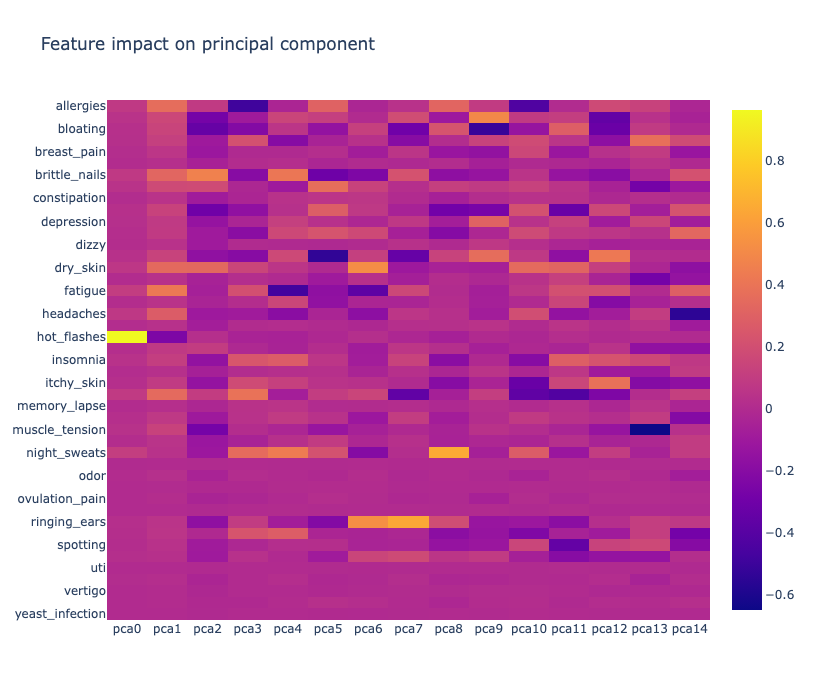

In [ ]:
px.imshow(impact, 
          width=512,
          height=700,
          aspect='auto',
          title='Feature impact on principal component')

For the clustering we just pick the components that give 80% variance

In [ ]:
pca = PCA(n_components=7, svd_solver='full')
pcacomponents = pca.fit_transform(X)
pcacomponents.shape

(25377, 7)

In [ ]:
from sklearn.cluster import KMeans

## Determining the optimal cluster size.

### Elbow Method

In [ ]:
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
}

# A list holds the SSE values for each k
sse = []
for k in range(1, 20):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    sse.append(kmeans.inertia_)

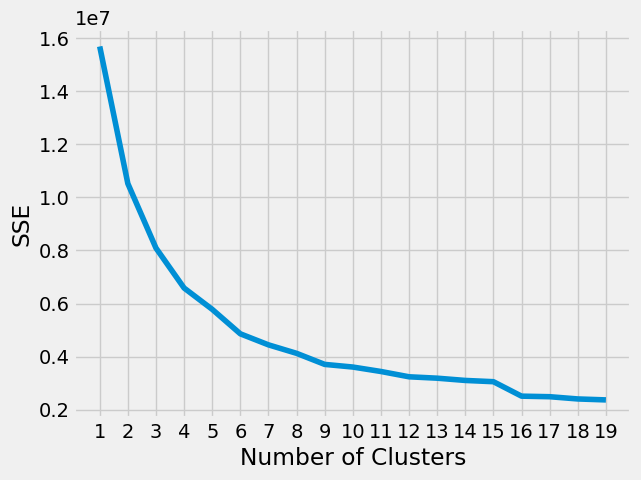

In [ ]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 20), sse)
plt.xticks(range(1, 20))
plt.xlabel("Number of Clusters")
plt.ylabel("SSE")
plt.show()

In [ ]:
from kneed import KneeLocator

kl = KneeLocator(
    range(1, 20), sse, curve="convex", direction="decreasing"
)

kl.knee

6

Conclusion - Based on the elbow method, it looks like the optimal number of clusters would be **6**

### Silhouette Coefficient

Is a measure of cluster cohesion and separation. It quantifies how well a data point fits into its assigned cluster based on two factors:
* How close the data point is to other points in the cluster
* How far away the data point is from points in other clusters

Silhouette coefficient values range between -1 and 1. Larger numbers indicate that samples are closer to their clusters than they are to other clusters.

In [ ]:
from sklearn.metrics import silhouette_score

# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 10):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(pcacomponents)
    score = silhouette_score(pcacomponents, kmeans.labels_)
    silhouette_coefficients.append(score)

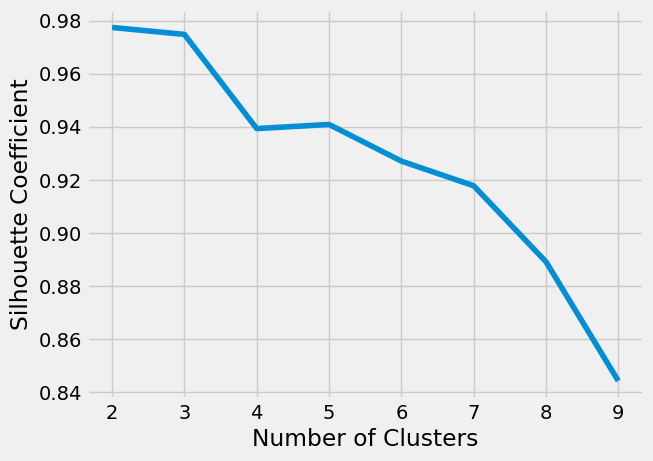

In [ ]:
plt.plot(range(2, 10), silhouette_coefficients)
plt.xticks(range(2, 10))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

Conclusion - From silhouette coeff it looks like the score is maximized for n=3 and then for n=6.
n=3 might be too small of a number of clusters. We will pick n=6 based on the elbow method + S method.

## Cluster them using k-means clustering

In [ ]:
kmeans = KMeans(n_clusters=6, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))

0 - 221
1 - 25037
2 - 41
3 - 64
4 - 9
5 - 5


## Get the users which belong to each of these clusters

In [ ]:
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]

## Find the top 5 symptoms reported by frequency for each of these segments.

In [ ]:
def getTopSymptoms(users, top=5):
    # Create the where statement that will be used to filter by these users.
    where_query = "uid = '{}'".format(users[0])
    for i in range(1, len(users)):
        where_query += " or uid = '{}'".format(users[i])
        
    query = """
        select name, count(name) occ from symptoms 
            where {where} 
            group by name
            order by occ desc
            limit {top}
    """.format(where=where_query, top=top)
    
    results = db.execQuery(query, cached=True)
    
    return results

In [ ]:
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)

Summary of cohort symptoms -

PCA + Clustering was able to isolate the users into 4 clusters based on the occurance of their symptom reporting.a

## Alternatively if we use n=3 for segmentation

In [ ]:
kmeans = KMeans(n_clusters=3, **kmeans_kwargs)
kmeans.fit(pcacomponents)
labels = kmeans.labels_
unq = np.unique(labels)
for u in unq:
    print('{} - {}'.format(u, np.argwhere(labels == u).size))
    
user_segments = [[] for i in range(0, unq.size)]

for (i, uid) in enumerate(X.index.values):
    user_segments[labels[i]] += [uid]
    
segments = [[] for i in range(0, unq.size)]

for (i, segment) in enumerate(user_segments):
    result = getTopSymptoms(segment)
    segments[i] = result['name'].values
    
for (i,s) in enumerate(segments):
    print('Segment {}'.format(i))
    print(s)